In [28]:
import numpy as np
import pandas as pd
from time import perf_counter
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

In [29]:
def random_search(distance_matrix, current_node_index=None):
    to_visit = set(range(len(distance_matrix)))
    
    if current_node_index is None:
        current_node_index = np.random.choice(list(to_visit))
    
    current_node = current_node_index
    solution = [current_node]
    total_cost = distance_matrix[current_node, current_node]
    to_visit.remove(current_node_index)
    
    while len(solution) != len(distance_matrix) // 2:
        next_node_index = np.random.choice(list(to_visit))
        next_node = next_node_index
        total_cost += distance_matrix[current_node, next_node]
        solution.append(next_node)
        to_visit.remove(next_node_index)
        current_node = next_node
    
    total_cost += distance_matrix[solution[-1], solution[0]]
    
    return solution, total_cost


In [30]:
def greedy_2_regret_weighted(distance_matrix, current_node_index=None, regret_weight=0.5):
    num_nodes = len(distance_matrix)
    to_visit = set(range(num_nodes))
    
    if current_node_index is None:
        current_node_index = np.random.choice(list(to_visit))
    
    current_node = current_node_index
    solution = [current_node]
    to_visit.remove(current_node_index)
    
    while len(solution) != len(distance_matrix) // 2:
        max_weighted_sum = float('-inf')
        best_node = None
        best_insertion_point = None

        for node in to_visit:
            insertion_costs = []
            for i in range(len(solution) - 1):
                cost = distance_matrix[solution[i]][node] + distance_matrix[node][solution[i+1]] - distance_matrix[solution[i]][solution[i+1]]
                insertion_costs.append((cost, i))

            insertion_costs.append((distance_matrix[solution[-1]][node] + distance_matrix[node][solution[0]] - distance_matrix[solution[-1]][solution[0]], len(solution) - 1))

            insertion_costs.sort(key=lambda x: x[0])

            weighted_sum = 0
            if len(insertion_costs) > 1:
                regret = insertion_costs[1][0] - insertion_costs[0][0]
                objectivee = -insertion_costs[0][0]
                weighted_sum = regret_weight * regret   +    (1 - regret_weight) * objectivee

            if weighted_sum > max_weighted_sum:
                max_weighted_sum = weighted_sum
                best_node = node
                best_insertion_point = insertion_costs[0][1]

        solution.insert(best_insertion_point + 1, best_node)
        to_visit.remove(best_node)

    total_cost = sum(distance_matrix[solution[i]][solution[i+1]] for i in range(len(solution) - 1))
    total_cost += distance_matrix[solution[-1]][solution[0]]

    return solution, total_cost

In [31]:
def calculate_euclidean_distance(node1, node2):
    return np.round(np.sqrt((node1['x'] - node2['x'])**2 + (node1['y'] - node2['y'])**2))


def get_distance_matrix(df, costs=False):
    num_nodes = df.shape[0]
    distance_matrix = np.zeros((num_nodes, num_nodes))
    for i in range(num_nodes):
        node1 = df.iloc[i]
        for j in range(i, num_nodes):
            node2 = df.iloc[j]
            distance = calculate_euclidean_distance(node1, node2)
            if costs:
                distance_matrix[i,j] = distance + node2['cost']
                distance_matrix[j,i] = distance + node1['cost']
            else:
                distance_matrix[i,j] = distance
                distance_matrix[j,i] = distance
    return distance_matrix

In [32]:
def get_node_moves(solution, flag):
    n = len(solution)
    moves = list()
    if flag == 'intra':
        for i in range(len(solution) - 1):
            for j in range(i+1, len(solution)):
                moves.append((solution[i], solution[j]))
    elif flag == 'inter':
        outer_nodes = list(set(range(int(n*2))) - set(solution))
        for i in range(len(solution)):
            for j in range(len(outer_nodes)):
                moves.append((solution[i], outer_nodes[j]))   
    return moves

In [33]:
def get_edge_moves(solution):
    moves = list()
    for i in range(len(solution) - 1):
        for j in range(i + 2, len(solution) - 1):
            edge1 = (solution[i], solution[i + 1])
            edge2 = (solution[j], solution[j + 1])
            moves.append((edge1, edge2))
    return moves

In [34]:
def compute_node_swap_delta(solution, swap, distance_matrix, costs, flag):
    new_solution = solution[:]
    n = len(new_solution)
    if flag == 'intra':
        node1, node2 = swap
        node1_idx, node2_idx = new_solution.index(node1), new_solution.index(node2)
        if node1_idx > node2_idx:
            node1, node2 = node2, node1
            node1_idx, node2_idx = node2_idx, node1_idx
        prev_node1, next_node1 = new_solution[node1_idx-1], new_solution[(node1_idx+1)%n]
        prev_node2, next_node2 = new_solution[node2_idx-1], new_solution[(node2_idx+1)%n]
        if (node1_idx+1)%n == node2_idx or (node2_idx+1)%n == node1_idx:
            if node1_idx==0 and node2_idx==len(new_solution)-1:
                prev_node1, node1, node2, next_node2 = prev_node2, node2, node1, next_node1
            elif node1_idx > node2_idx:
                node1_idx, node2_idx = node2_idx, node1_idx
                prev_node1, next_node2 = prev_node2, next_node1
                node1, node2 = node2, node1
            old_cost = distance_matrix[prev_node1][node1] + distance_matrix[node1][node2] + distance_matrix[node2][next_node2]
            new_cost = distance_matrix[prev_node1][node2] + distance_matrix[node2][node1] + distance_matrix[node1][next_node2]
        else:
            old_cost = distance_matrix[prev_node1][node1] + distance_matrix[node1][next_node1] + \
                       distance_matrix[prev_node2][node2] + distance_matrix[node2][next_node2]
            new_cost = distance_matrix[prev_node1][node2] + distance_matrix[node2][next_node1] + \
                       distance_matrix[prev_node2][node1] + distance_matrix[node1][next_node2]
        delta = old_cost - new_cost

        new_solution[node1_idx], new_solution[node2_idx] = new_solution[node2_idx], new_solution[node1_idx]
        
    elif flag == 'inter':
        solution_node, outer_node = swap
        solution_node_idx = new_solution.index(solution_node)
        prev_solution_node, next_solution_node = new_solution[solution_node_idx-1], new_solution[(solution_node_idx+1)%n]

        old_cost = distance_matrix[prev_solution_node][solution_node] + distance_matrix[solution_node][next_solution_node] + \
                   costs[solution_node]
        new_cost = distance_matrix[prev_solution_node][outer_node] + distance_matrix[outer_node][next_solution_node] + \
                   costs[outer_node]
        
        delta = old_cost - new_cost
        new_solution[solution_node_idx] = outer_node

    return delta, new_solution

In [35]:
def compute_edge_swap_delta(solution, swap, distance_matrix):
    (edge1_start, edge1_end), (edge2_start, edge2_end) = swap
    idx_edge1_start = solution.index(edge1_start)
    idx_edge2_start = solution.index(edge2_start)
    
    old_distance = distance_matrix[edge1_start][edge1_end] + distance_matrix[edge2_start][edge2_end]
    new_distance = distance_matrix[edge1_start][edge2_start] + distance_matrix[edge1_end][edge2_end]
    
    delta = old_distance - new_distance


    if idx_edge1_start < idx_edge2_start:
        new_solution = solution[:idx_edge1_start+1] + solution[idx_edge1_start+1:idx_edge2_start+1][::-1] + \
                       solution[idx_edge2_start+1:] 
    else:
        new_solution = solution[:idx_edge2_start+1] + solution[idx_edge2_start+1:idx_edge1_start+1][::-1] + \
                       solution[idx_edge1_start+1:]
    return delta, new_solution

In [36]:
def greedy_local_search(solution, distance_matrix, costs, flag):
    
    if flag == 'edges':
        while True:
            neighborhood_edges = get_edge_moves(solution)
            neighborhood_edges = list(zip( neighborhood_edges, ['edge']*len(neighborhood_edges) ))
            
            neighborhood_nodes = get_node_moves(solution, 'inter')
            neighborhood_nodes = list(zip( neighborhood_nodes, ['node']*len(neighborhood_nodes) ))
            
            neighborhood = neighborhood_edges + neighborhood_nodes
            np.random.shuffle(neighborhood)
            
            for i, neighbor in enumerate(neighborhood):
                if neighbor[1] == 'edge':
                    delta, new_solution = compute_edge_swap_delta(solution, neighbor[0], distance_matrix)
                elif neighbor[1] == 'node':
                    delta, new_solution  = compute_node_swap_delta(solution, neighbor[0], distance_matrix, costs, 'inter')
                if delta > 0:
                    solution = new_solution[:]
                    break
            else:
                return solution
            
    elif flag == 'nodes':
        while True:
            neighborhood_intra = get_node_moves(solution, 'intra')
            neighborhood_intra = list(zip( neighborhood_intra, ['intra']*len(neighborhood_intra) ))
            
            neighborhood_inter = get_node_moves(solution, 'inter')
            neighborhood_inter = list(zip( neighborhood_inter, ['inter']*len(neighborhood_inter) ))
            
            neighborhood = neighborhood_inter + neighborhood_intra
            np.random.shuffle(neighborhood)
            
            for i, neighbor in enumerate(neighborhood):
                delta, new_solution = compute_node_swap_delta(solution, neighbor[0], distance_matrix, costs, neighbor[1])
                if delta > 0:
                    solution = new_solution[:]
                    break
            else:
                return solution

In [37]:
def steepest_local_search(solution, distance_matrix, costs, flag):
    
    if flag == 'edges':
        while True:
            neighborhood_edges = get_edge_moves(solution)
            neighborhood_edges = list(zip( neighborhood_edges, ['edge']*len(neighborhood_edges) ))
            
            neighborhood_nodes = get_node_moves(solution, 'inter')
            neighborhood_nodes = list(zip( neighborhood_nodes, ['node']*len(neighborhood_nodes) ))
            
            neighborhood = neighborhood_edges + neighborhood_nodes
            
            best_delta, best_solution = 0, None
            for i, neighbor in enumerate(neighborhood):
                if neighbor[1] == 'edge':
                    delta, new_solution = compute_edge_swap_delta(solution, neighbor[0], distance_matrix)
                elif neighbor[1] == 'node':
                    delta, new_solution  = compute_node_swap_delta(solution, neighbor[0], distance_matrix, costs, 'inter')
                if delta > best_delta:
                    best_delta = delta
                    best_solution = new_solution[:]
            
            if best_solution is not None:
                solution = best_solution[:]
                continue
            return solution
        
    elif flag == 'nodes':
        while True:
            neighborhood_intra = get_node_moves(solution, 'intra')
            neighborhood_intra = list(zip( neighborhood_intra, ['intra']*len(neighborhood_intra) ))
            
            neighborhood_inter = get_node_moves(solution, 'inter')
            neighborhood_inter = list(zip( neighborhood_inter, ['inter']*len(neighborhood_inter) ))
            
            neighborhood = neighborhood_inter + neighborhood_intra
            best_delta, best_solution = 0, None
            for i, neighbor in enumerate(neighborhood):
                delta, new_solution = compute_node_swap_delta(solution, neighbor[0], distance_matrix, costs, neighbor[1])
                if delta > best_delta:
                    best_delta = delta
                    best_solution = new_solution[:]
            
            if best_solution is not None:
                solution = best_solution[:]
                continue
            return solution
            

In [38]:
columns = ["Algorithm", "TSPA", "TSPB", "TSPC", "TSPD"]
cost_df = pd.DataFrame(columns=columns)
time_df = pd.DataFrame(columns=columns)
best_solutions = {}

search_types = {'Greedy': greedy_local_search, 'Steepest': steepest_local_search}
starting_solutions = {'Random': random_search, 'GreedyHeuristic': greedy_2_regret_weighted}
instances = ['TSPA', 'TSPB', 'TSPC', 'TSPD']
path = "../data/"
for search_type in search_types:
    for flag in ('edges', 'nodes'):
        for starting_solution in starting_solutions:
            algo_name = f'{search_type}-{flag}-{starting_solution}'
            new_row = pd.DataFrame({columns[0]: algo_name}, index=[0])
            cost_df = pd.concat([cost_df, new_row], ignore_index=True)
            time_df = pd.concat([time_df, new_row], ignore_index=True)
            best_solutions_tmp = {}
            for instance in instances:
                file_name = f'{path}{instance}.csv'
                df = pd.read_csv(file_name, names=['x', 'y', 'cost'], sep=';')
                distance_matrix = get_distance_matrix(df)
                distance_matrix_with_costs = get_distance_matrix(df, True)
                costs = df.cost.values
                total_costs, solutions, times = list(), list(), list()
                print(algo_name, instance)
                for i in range(200):
                    print(i)
                    solution, _ = starting_solutions[starting_solution](distance_matrix_with_costs)
                    start_time = perf_counter()
                    solution = search_types[search_type](solution, distance_matrix, costs, flag)
                    total_cost = sum(distance_matrix_with_costs[solution[i]][solution[i+1]] for i in range(len(solution) - 1))
                    total_cost += distance_matrix_with_costs[solution[-1]][solution[0]]
                    end_time = perf_counter()
                    total_costs.append(total_cost)
                    solutions.append(solution)
                    times.append(round(end_time - start_time, 3))
                best_solution_idx = np.argmin(total_costs)
                best_solutions_tmp[file_name] = solutions[best_solution_idx]
                cost_df.at[cost_df.index[-1], instance] = f'{np.mean(total_costs)} ({np.min(total_costs)} - {np.max(total_costs)})'
                time_df.at[time_df.index[-1], instance] = f'{round(np.mean(times), 3)} ({np.min(times)} - {np.max(times)})'
                print(f'{np.mean(total_costs)} ({np.min(total_costs)} - {np.max(total_costs)})')
                print(f'{np.mean(times)} ({np.min(times)} - {np.max(times)})')
                print(solutions[best_solution_idx])
                display(cost_df)
                display(time_df)
            best_solutions[algo_name] = best_solutions_tmp

Greedy-edges-Random TSPA
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
77965.71 (75112.0 - 82142.0)
7.681500000000001 (6.255 - 9.005)
[141, 6, 66, 98, 190, 72, 94, 12, 73, 31, 111, 14, 80, 124, 8, 110, 169, 95, 112, 5, 51, 135, 134, 119, 26, 92, 48, 106, 11, 152, 130, 109, 189, 75, 174, 177, 1, 41, 137, 199, 175, 101, 167, 153, 88, 127, 186, 24, 87, 144,

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),NaN,NaN,NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),NaN,NaN,NaN


Greedy-edges-Random TSPB
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
71018.74 (68315.0 - 74769.0)
7.989069999999999 (6.794 - 9.754)
[189, 59, 119, 71, 193, 139, 107, 12, 52, 16, 18, 132, 185, 29, 33, 73, 136, 79, 145, 157, 80, 153, 55, 88, 137, 37, 165, 36, 25, 134, 154, 50, 127, 24, 131, 103, 38, 101, 31, 34, 183, 197, 179, 121, 143, 122, 92, 99, 57, 

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),NaN,NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),NaN,NaN


Greedy-edges-Random TSPC
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
51652.62 (49206.0 - 54174.0)
7.739495 (6.556 - 9.202)
[114, 121, 91, 161, 76, 0, 40, 128, 132, 36, 55, 22, 117, 171, 194, 79, 21, 157, 153, 88, 127, 186, 45, 167, 101, 60, 126, 174, 199, 137, 41, 177, 1, 75, 189, 109, 119, 130, 152, 11, 48, 92, 26, 8, 124, 80, 31, 73, 95, 169, 135, 11

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),NaN


Greedy-edges-Random TSPD
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
48705.455 (45913.0 - 51873.0)
6.698525 (4.754 - 12.083)
[163, 182, 2, 133, 5, 128, 34, 183, 197, 31, 101, 38, 103, 121, 24, 127, 179, 143, 122, 99, 37, 165, 154, 134, 25, 36, 137, 88, 55, 153, 145, 157, 80, 57, 0, 169, 66, 135, 198, 190, 19, 136, 61, 73, 33, 29, 18, 52, 132, 185, 47, 

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)


Greedy-edges-GreedyHeuristic TSPA
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
75438.075 (74521.0 - 77298.0)
0.26860500000000004 (0.073 - 0.655)
[94, 72, 190, 98, 66, 156, 6, 24, 141, 144, 87, 79, 194, 21, 171, 154, 81, 62, 108, 15, 117, 53, 22, 195, 55, 36, 132, 128, 25, 181, 113, 74, 163, 61, 71, 20, 64, 185, 96, 27, 116, 147, 59, 143, 159, 164, 178, 

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),NaN,NaN,NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),NaN,NaN,NaN


Greedy-edges-GreedyHeuristic TSPB
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
70388.815 (67808.0 - 76131.0)
0.418135 (0.202 - 0.92)
[119, 59, 193, 139, 107, 12, 52, 132, 185, 73, 61, 136, 33, 29, 18, 16, 172, 95, 135, 198, 190, 19, 145, 157, 80, 153, 4, 55, 88, 137, 37, 165, 36, 25, 134, 154, 112, 50, 99, 57, 0, 169, 66, 26, 92, 122, 143, 127, 24, 121,

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),NaN,NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),NaN,NaN


Greedy-edges-GreedyHeuristic TSPC
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
53714.495 (51034.0 - 56971.0)
0.31464000000000003 (0.069 - 0.831)
[44, 102, 144, 141, 87, 79, 194, 21, 157, 129, 170, 186, 45, 127, 88, 153, 167, 60, 9, 101, 99, 135, 51, 5, 112, 190, 66, 6, 172, 156, 98, 72, 12, 94, 42, 89, 73, 31, 80, 8, 110, 169, 95, 139, 134, 119, 26, 92,

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),NaN


Greedy-edges-GreedyHeuristic TSPD
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
51525.635 (47281.0 - 57524.0)
0.36553 (0.102 - 0.995)
[126, 158, 162, 150, 44, 117, 196, 192, 21, 138, 142, 130, 161, 174, 188, 140, 148, 141, 53, 96, 32, 113, 69, 115, 82, 63, 8, 14, 16, 172, 95, 163, 182, 2, 133, 167, 5, 11, 34, 183, 197, 179, 121, 24, 127, 143, 122, 92, 26

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)


Greedy-nodes-Random TSPA
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
90554.405 (83565.0 - 100644.0)
4.004625 (3.243 - 5.092)
[76, 91, 121, 43, 50, 149, 0, 19, 178, 164, 181, 61, 71, 183, 163, 74, 113, 195, 53, 62, 32, 180, 6, 98, 190, 72, 12, 94, 89, 111, 14, 80, 8, 169, 95, 31, 112, 171, 117, 22, 55, 36, 128, 40, 37, 25, 20, 64, 185, 27, 147, 96, 59, 

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),NaN,NaN,NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),NaN,NaN,NaN


Greedy-nodes-Random TSPB
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
85537.285 (77218.0 - 93542.0)
4.125825 (3.348 - 5.451)
[63, 84, 59, 119, 162, 156, 91, 70, 51, 174, 21, 196, 139, 107, 12, 8, 172, 95, 16, 189, 170, 181, 147, 159, 64, 89, 129, 71, 44, 117, 150, 158, 67, 114, 72, 85, 166, 192, 188, 140, 148, 130, 141, 2, 34, 31, 101, 38, 103, 131, 137

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),NaN,NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),NaN,NaN


Greedy-nodes-Random TSPC
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
63718.49 (56594.0 - 71397.0)
3.9456149999999997 (3.129 - 5.034)
[88, 127, 186, 167, 101, 98, 66, 6, 141, 87, 144, 102, 154, 81, 131, 180, 32, 62, 53, 18, 67, 24, 190, 72, 12, 94, 42, 89, 73, 31, 80, 124, 8, 110, 169, 95, 135, 99, 175, 149, 0, 178, 19, 50, 2, 29, 83, 75, 189, 119, 48, 

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),NaN


Greedy-nodes-Random TSPD
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
61963.345 (54964.0 - 69495.0)
4.46873 (3.086 - 9.898)
[179, 128, 178, 144, 66, 169, 27, 92, 50, 152, 131, 103, 38, 24, 127, 43, 99, 37, 165, 154, 134, 25, 36, 88, 55, 4, 153, 137, 146, 80, 157, 145, 57, 0, 26, 197, 183, 34, 5, 2, 115, 69, 113, 53, 142, 130, 141, 148, 140, 67, 114, 64,

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)


Greedy-nodes-GreedyHeuristic TSPA
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
75512.725 (74521.0 - 77471.0)
0.24265499999999998 (0.082 - 0.802)
[94, 72, 190, 98, 66, 156, 6, 24, 141, 144, 87, 79, 194, 21, 171, 154, 81, 62, 108, 15, 117, 53, 22, 195, 55, 36, 132, 128, 25, 181, 113, 74, 163, 61, 71, 20, 64, 185, 96, 27, 116, 147, 59, 143, 159, 164, 178, 

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),NaN,NaN,NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),NaN,NaN,NaN


Greedy-nodes-GreedyHeuristic TSPB
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
70688.61 (68572.0 - 76529.0)
0.291025 (0.145 - 0.581)
[69, 115, 82, 63, 8, 14, 16, 172, 95, 198, 135, 66, 169, 0, 57, 99, 92, 122, 143, 179, 197, 183, 34, 31, 101, 42, 38, 103, 131, 121, 127, 24, 50, 152, 94, 112, 154, 134, 25, 36, 123, 165, 37, 102, 137, 88, 55, 4, 153, 80, 

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),NaN,NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),NaN,NaN


Greedy-nodes-GreedyHeuristic TSPC
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
53967.21 (51195.0 - 56739.0)
0.241985 (0.073 - 0.663)
[24, 45, 186, 127, 88, 153, 167, 60, 9, 101, 99, 135, 51, 5, 112, 190, 72, 12, 94, 42, 89, 73, 31, 80, 95, 169, 110, 8, 26, 92, 48, 11, 152, 130, 119, 109, 189, 75, 1, 177, 41, 137, 174, 39, 199, 150, 192, 175, 2, 4, 77, 4

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),NaN


Greedy-nodes-GreedyHeuristic TSPD
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
51145.425 (47368.0 - 57605.0)
0.283835 (0.083 - 0.765)
[91, 70, 51, 174, 161, 188, 140, 148, 141, 130, 142, 53, 96, 32, 113, 69, 82, 63, 8, 115, 40, 163, 182, 2, 133, 167, 5, 11, 34, 183, 197, 179, 121, 24, 127, 143, 122, 92, 26, 128, 66, 169, 0, 57, 99, 146, 137, 37, 165, 12

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)


Steepest-edges-Random TSPA
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
78307.45 (75390.0 - 83932.0)
12.176375 (10.589 - 14.762)
[74, 163, 113, 195, 53, 108, 62, 32, 81, 154, 171, 15, 117, 22, 55, 36, 132, 128, 76, 161, 91, 114, 4, 175, 153, 88, 127, 186, 21, 194, 79, 87, 144, 141, 45, 167, 101, 99, 135, 51, 5, 112, 190, 66, 6, 156, 98, 72, 12, 94, 89, 

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),NaN,NaN,NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),NaN,NaN,NaN


Steepest-edges-Random TSPB
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
71637.29 (68186.0 - 77703.0)
12.516195 (11.009 - 14.349)
[101, 38, 103, 131, 121, 24, 127, 122, 92, 26, 128, 66, 169, 0, 57, 99, 50, 112, 154, 134, 25, 36, 194, 123, 165, 37, 137, 88, 55, 153, 80, 157, 145, 19, 190, 198, 135, 172, 16, 52, 18, 29, 33, 136, 73, 185, 132, 12, 107, 139,

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),71637.29 (68186.0 - 77703.0),NaN,NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),12.516 (11.009 - 14.349),NaN,NaN


Steepest-edges-Random TSPC
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
51692.4 (49183.0 - 54617.0)
11.872455 (10.033 - 13.814)
[14, 111, 31, 73, 95, 169, 135, 51, 112, 72, 190, 98, 66, 156, 6, 24, 186, 127, 88, 153, 157, 21, 194, 79, 67, 87, 141, 144, 102, 133, 154, 81, 171, 28, 117, 22, 55, 195, 53, 18, 15, 108, 62, 155, 163, 74, 113, 181, 61, 71, 20,

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),71637.29 (68186.0 - 77703.0),51692.4 (49183.0 - 54617.0),NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),12.516 (11.009 - 14.349),11.872 (10.033 - 13.814),NaN


Steepest-edges-Random TSPD
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
48647.455 (46150.0 - 51579.0)
12.582855000000002 (10.98 - 14.19)
[159, 147, 87, 187, 181, 100, 170, 47, 189, 59, 119, 71, 193, 139, 107, 12, 52, 18, 132, 185, 73, 61, 136, 145, 80, 153, 55, 88, 137, 146, 37, 165, 36, 25, 134, 154, 102, 99, 43, 50, 24, 127, 121, 131, 103, 38, 42, 101

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),71637.29 (68186.0 - 77703.0),51692.4 (49183.0 - 54617.0),48647.455 (46150.0 - 51579.0)


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),12.516 (11.009 - 14.349),11.872 (10.033 - 13.814),12.583 (10.98 - 14.19)


Steepest-edges-GreedyHeuristic TSPA
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
75391.6 (74541.0 - 77063.0)
0.53781 (0.073 - 1.405)
[42, 89, 94, 12, 72, 190, 98, 66, 156, 6, 24, 141, 144, 87, 79, 194, 21, 171, 154, 81, 62, 108, 15, 117, 53, 22, 195, 55, 36, 132, 128, 25, 181, 113, 74, 163, 61, 71, 20, 64, 185, 96, 27, 116, 147, 59, 143, 159, 164, 178, 

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),71637.29 (68186.0 - 77703.0),51692.4 (49183.0 - 54617.0),48647.455 (46150.0 - 51579.0)
5,Steepest-edges-GreedyHeuristic,75391.6 (74541.0 - 77063.0),NaN,NaN,NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),12.516 (11.009 - 14.349),11.872 (10.033 - 13.814),12.583 (10.98 - 14.19)
5,Steepest-edges-GreedyHeuristic,0.538 (0.073 - 1.405),NaN,NaN,NaN


Steepest-edges-GreedyHeuristic TSPB
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
70215.965 (68122.0 - 75907.0)
0.88324 (0.337 - 1.591)
[158, 162, 150, 44, 117, 196, 192, 21, 142, 130, 174, 51, 91, 70, 140, 148, 141, 53, 69, 115, 82, 63, 8, 14, 16, 172, 95, 163, 182, 2, 5, 34, 183, 197, 179, 31, 101, 42, 38, 103, 131, 121, 24, 127, 143, 122, 92, 26, 66, 

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),71637.29 (68186.0 - 77703.0),51692.4 (49183.0 - 54617.0),48647.455 (46150.0 - 51579.0)
5,Steepest-edges-GreedyHeuristic,75391.6 (74541.0 - 77063.0),70215.965 (68122.0 - 75907.0),NaN,NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),12.516 (11.009 - 14.349),11.872 (10.033 - 13.814),12.583 (10.98 - 14.19)
5,Steepest-edges-GreedyHeuristic,0.538 (0.073 - 1.405),0.883 (0.337 - 1.591),NaN,NaN


Steepest-edges-GreedyHeuristic TSPC
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
53529.02 (50972.0 - 57024.0)
0.647755 (0.065 - 1.511)
[81, 171, 108, 62, 15, 117, 53, 22, 55, 195, 74, 163, 113, 132, 128, 40, 164, 178, 19, 35, 69, 0, 149, 50, 121, 91, 114, 175, 2, 4, 77, 43, 192, 150, 199, 39, 174, 137, 41, 177, 1, 75, 189, 109, 130, 152, 11, 160, 106, 4

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),71637.29 (68186.0 - 77703.0),51692.4 (49183.0 - 54617.0),48647.455 (46150.0 - 51579.0)
5,Steepest-edges-GreedyHeuristic,75391.6 (74541.0 - 77063.0),70215.965 (68122.0 - 75907.0),53529.02 (50972.0 - 57024.0),NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),12.516 (11.009 - 14.349),11.872 (10.033 - 13.814),12.583 (10.98 - 14.19)
5,Steepest-edges-GreedyHeuristic,0.538 (0.073 - 1.405),0.883 (0.337 - 1.591),0.648 (0.065 - 1.511),NaN


Steepest-edges-GreedyHeuristic TSPD
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
51093.845 (46915.0 - 57412.0)
0.73032 (0.133 - 2.109)
[87, 147, 159, 64, 129, 89, 58, 171, 72, 114, 85, 166, 28, 59, 119, 193, 71, 44, 162, 150, 117, 196, 192, 21, 138, 142, 130, 161, 174, 188, 140, 148, 141, 53, 96, 32, 113, 69, 115, 82, 63, 8, 14, 84, 139, 97, 107, 12, 52

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),71637.29 (68186.0 - 77703.0),51692.4 (49183.0 - 54617.0),48647.455 (46150.0 - 51579.0)
5,Steepest-edges-GreedyHeuristic,75391.6 (74541.0 - 77063.0),70215.965 (68122.0 - 75907.0),53529.02 (50972.0 - 57024.0),51093.845 (46915.0 - 57412.0)


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),12.516 (11.009 - 14.349),11.872 (10.033 - 13.814),12.583 (10.98 - 14.19)
5,Steepest-edges-GreedyHeuristic,0.538 (0.073 - 1.405),0.883 (0.337 - 1.591),0.648 (0.065 - 1.511),0.73 (0.133 - 2.109)


Steepest-nodes-Random TSPA
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
93224.675 (84578.0 - 101323.0)
14.77748 (11.815 - 18.468)
[145, 164, 178, 19, 69, 149, 43, 192, 199, 41, 177, 1, 119, 8, 80, 111, 31, 112, 134, 130, 152, 11, 48, 106, 26, 169, 95, 109, 189, 75, 135, 51, 190, 72, 12, 94, 98, 156, 172, 6, 66, 45, 186, 127, 170, 79, 194, 21, 88, 153, 1

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),71637.29 (68186.0 - 77703.0),51692.4 (49183.0 - 54617.0),48647.455 (46150.0 - 51579.0)
5,Steepest-edges-GreedyHeuristic,75391.6 (74541.0 - 77063.0),70215.965 (68122.0 - 75907.0),53529.02 (50972.0 - 57024.0),51093.845 (46915.0 - 57412.0)
6,Steepest-nodes-Random,93224.675 (84578.0 - 101323.0),NaN,NaN,NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),12.516 (11.009 - 14.349),11.872 (10.033 - 13.814),12.583 (10.98 - 14.19)
5,Steepest-edges-GreedyHeuristic,0.538 (0.073 - 1.405),0.883 (0.337 - 1.591),0.648 (0.065 - 1.511),0.73 (0.133 - 2.109)
6,Steepest-nodes-Random,14.777 (11.815 - 18.468),NaN,NaN,NaN


Steepest-nodes-Random TSPB
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
88096.545 (80827.0 - 96390.0)
14.972285 (12.168 - 18.308)
[137, 183, 34, 5, 133, 182, 163, 69, 140, 174, 51, 91, 156, 67, 63, 8, 172, 127, 24, 50, 99, 57, 190, 19, 198, 128, 66, 169, 157, 145, 79, 33, 29, 18, 132, 59, 159, 147, 181, 170, 61, 73, 185, 12, 107, 139, 52, 16, 95, 135, 3

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),71637.29 (68186.0 - 77703.0),51692.4 (49183.0 - 54617.0),48647.455 (46150.0 - 51579.0)
5,Steepest-edges-GreedyHeuristic,75391.6 (74541.0 - 77063.0),70215.965 (68122.0 - 75907.0),53529.02 (50972.0 - 57024.0),51093.845 (46915.0 - 57412.0)
6,Steepest-nodes-Random,93224.675 (84578.0 - 101323.0),88096.545 (80827.0 - 96390.0),NaN,NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),12.516 (11.009 - 14.349),11.872 (10.033 - 13.814),12.583 (10.98 - 14.19)
5,Steepest-edges-GreedyHeuristic,0.538 (0.073 - 1.405),0.883 (0.337 - 1.591),0.648 (0.065 - 1.511),0.73 (0.133 - 2.109)
6,Steepest-nodes-Random,14.777 (11.815 - 18.468),14.972 (12.168 - 18.308),NaN,NaN


Steepest-nodes-Random TSPC
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
65743.78 (58924.0 - 77555.0)
14.376055000000001 (11.243 - 18.885)
[194, 79, 87, 141, 24, 45, 91, 149, 69, 19, 178, 164, 113, 74, 53, 15, 81, 154, 133, 102, 144, 21, 157, 170, 186, 127, 88, 117, 22, 195, 181, 116, 27, 147, 96, 59, 143, 159, 37, 118, 132, 36, 55, 6, 98, 72, 94, 89, 31

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),71637.29 (68186.0 - 77703.0),51692.4 (49183.0 - 54617.0),48647.455 (46150.0 - 51579.0)
5,Steepest-edges-GreedyHeuristic,75391.6 (74541.0 - 77063.0),70215.965 (68122.0 - 75907.0),53529.02 (50972.0 - 57024.0),51093.845 (46915.0 - 57412.0)
6,Steepest-nodes-Random,93224.675 (84578.0 - 101323.0),88096.545 (80827.0 - 96390.0),65743.78 (58924.0 - 77555.0),NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),12.516 (11.009 - 14.349),11.872 (10.033 - 13.814),12.583 (10.98 - 14.19)
5,Steepest-edges-GreedyHeuristic,0.538 (0.073 - 1.405),0.883 (0.337 - 1.591),0.648 (0.065 - 1.511),0.73 (0.133 - 2.109)
6,Steepest-nodes-Random,14.777 (11.815 - 18.468),14.972 (12.168 - 18.308),14.376 (11.243 - 18.885),NaN


Steepest-nodes-Random TSPD
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
64443.6 (55944.0 - 78053.0)
14.716145000000001 (11.481 - 19.12)
[143, 179, 121, 38, 103, 24, 127, 50, 154, 25, 36, 88, 55, 137, 165, 37, 99, 57, 190, 19, 18, 97, 59, 119, 193, 196, 21, 142, 192, 117, 166, 129, 89, 159, 64, 71, 44, 150, 162, 158, 114, 67, 45, 3, 156, 91, 70, 51, 174,

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),71637.29 (68186.0 - 77703.0),51692.4 (49183.0 - 54617.0),48647.455 (46150.0 - 51579.0)
5,Steepest-edges-GreedyHeuristic,75391.6 (74541.0 - 77063.0),70215.965 (68122.0 - 75907.0),53529.02 (50972.0 - 57024.0),51093.845 (46915.0 - 57412.0)
6,Steepest-nodes-Random,93224.675 (84578.0 - 101323.0),88096.545 (80827.0 - 96390.0),65743.78 (58924.0 - 77555.0),64443.6 (55944.0 - 78053.0)


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),12.516 (11.009 - 14.349),11.872 (10.033 - 13.814),12.583 (10.98 - 14.19)
5,Steepest-edges-GreedyHeuristic,0.538 (0.073 - 1.405),0.883 (0.337 - 1.591),0.648 (0.065 - 1.511),0.73 (0.133 - 2.109)
6,Steepest-nodes-Random,14.777 (11.815 - 18.468),14.972 (12.168 - 18.308),14.376 (11.243 - 18.885),14.716 (11.481 - 19.12)


Steepest-nodes-GreedyHeuristic TSPA
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
75606.625 (74630.0 - 76953.0)
0.335035 (0.074 - 1.124)
[156, 66, 98, 190, 72, 94, 12, 73, 31, 111, 14, 80, 124, 123, 8, 110, 169, 95, 112, 5, 51, 135, 99, 134, 119, 26, 106, 48, 11, 152, 130, 109, 189, 75, 1, 177, 41, 199, 150, 192, 60, 101, 167, 45, 186, 127, 88, 153, 175,

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),71637.29 (68186.0 - 77703.0),51692.4 (49183.0 - 54617.0),48647.455 (46150.0 - 51579.0)
5,Steepest-edges-GreedyHeuristic,75391.6 (74541.0 - 77063.0),70215.965 (68122.0 - 75907.0),53529.02 (50972.0 - 57024.0),51093.845 (46915.0 - 57412.0)
6,Steepest-nodes-Random,93224.675 (84578.0 - 101323.0),88096.545 (80827.0 - 96390.0),65743.78 (58924.0 - 77555.0),64443.6 (55944.0 - 78053.0)
7,Steepest-nodes-GreedyHeuristic,75606.625 (74630.0 - 76953.0),NaN,NaN,NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),12.516 (11.009 - 14.349),11.872 (10.033 - 13.814),12.583 (10.98 - 14.19)
5,Steepest-edges-GreedyHeuristic,0.538 (0.073 - 1.405),0.883 (0.337 - 1.591),0.648 (0.065 - 1.511),0.73 (0.133 - 2.109)
6,Steepest-nodes-Random,14.777 (11.815 - 18.468),14.972 (12.168 - 18.308),14.376 (11.243 - 18.885),14.716 (11.481 - 19.12)
7,Steepest-nodes-GreedyHeuristic,0.335 (0.074 - 1.124),NaN,NaN,NaN


Steepest-nodes-GreedyHeuristic TSPB
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
70758.4 (68572.0 - 76545.0)
0.6690550000000001 (0.345 - 1.219)
[69, 115, 82, 63, 8, 14, 16, 172, 95, 198, 135, 66, 169, 0, 57, 99, 92, 122, 143, 179, 197, 183, 34, 31, 101, 42, 38, 103, 131, 121, 127, 24, 50, 152, 94, 112, 154, 134, 25, 36, 123, 165, 37, 102, 137, 88, 55, 4

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),71637.29 (68186.0 - 77703.0),51692.4 (49183.0 - 54617.0),48647.455 (46150.0 - 51579.0)
5,Steepest-edges-GreedyHeuristic,75391.6 (74541.0 - 77063.0),70215.965 (68122.0 - 75907.0),53529.02 (50972.0 - 57024.0),51093.845 (46915.0 - 57412.0)
6,Steepest-nodes-Random,93224.675 (84578.0 - 101323.0),88096.545 (80827.0 - 96390.0),65743.78 (58924.0 - 77555.0),64443.6 (55944.0 - 78053.0)
7,Steepest-nodes-GreedyHeuristic,75606.625 (74630.0 - 76953.0),70758.4 (68572.0 - 76545.0),NaN,NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),12.516 (11.009 - 14.349),11.872 (10.033 - 13.814),12.583 (10.98 - 14.19)
5,Steepest-edges-GreedyHeuristic,0.538 (0.073 - 1.405),0.883 (0.337 - 1.591),0.648 (0.065 - 1.511),0.73 (0.133 - 2.109)
6,Steepest-nodes-Random,14.777 (11.815 - 18.468),14.972 (12.168 - 18.308),14.376 (11.243 - 18.885),14.716 (11.481 - 19.12)
7,Steepest-nodes-GreedyHeuristic,0.335 (0.074 - 1.124),0.669 (0.345 - 1.219),NaN,NaN


Steepest-nodes-GreedyHeuristic TSPC
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
53807.135 (51203.0 - 57026.0)
0.5785 (0.077 - 1.63)
[102, 144, 141, 87, 79, 194, 21, 157, 129, 170, 186, 45, 127, 88, 153, 167, 60, 9, 101, 99, 135, 51, 5, 112, 190, 66, 6, 172, 156, 98, 72, 12, 94, 42, 89, 73, 31, 80, 95, 169, 110, 8, 139, 134, 119, 26, 92, 48, 106, 11, 15

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),71637.29 (68186.0 - 77703.0),51692.4 (49183.0 - 54617.0),48647.455 (46150.0 - 51579.0)
5,Steepest-edges-GreedyHeuristic,75391.6 (74541.0 - 77063.0),70215.965 (68122.0 - 75907.0),53529.02 (50972.0 - 57024.0),51093.845 (46915.0 - 57412.0)
6,Steepest-nodes-Random,93224.675 (84578.0 - 101323.0),88096.545 (80827.0 - 96390.0),65743.78 (58924.0 - 77555.0),64443.6 (55944.0 - 78053.0)
7,Steepest-nodes-GreedyHeuristic,75606.625 (74630.0 - 76953.0),70758.4 (68572.0 - 76545.0),53807.135 (51203.0 - 57026.0),NaN


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),12.516 (11.009 - 14.349),11.872 (10.033 - 13.814),12.583 (10.98 - 14.19)
5,Steepest-edges-GreedyHeuristic,0.538 (0.073 - 1.405),0.883 (0.337 - 1.591),0.648 (0.065 - 1.511),0.73 (0.133 - 2.109)
6,Steepest-nodes-Random,14.777 (11.815 - 18.468),14.972 (12.168 - 18.308),14.376 (11.243 - 18.885),14.716 (11.481 - 19.12)
7,Steepest-nodes-GreedyHeuristic,0.335 (0.074 - 1.124),0.669 (0.345 - 1.219),0.578 (0.077 - 1.63),NaN


Steepest-nodes-GreedyHeuristic TSPD
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
51203.305 (46990.0 - 55945.0)
0.62834 (0.145 - 1.347)
[158, 162, 150, 44, 117, 196, 192, 21, 138, 142, 130, 161, 174, 188, 140, 148, 141, 53, 96, 32, 113, 69, 115, 82, 63, 8, 14, 16, 172, 95, 163, 182, 2, 133, 167, 5, 11, 34, 183, 197, 179, 121, 24, 127, 143, 122, 92, 26, 1

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),71637.29 (68186.0 - 77703.0),51692.4 (49183.0 - 54617.0),48647.455 (46150.0 - 51579.0)
5,Steepest-edges-GreedyHeuristic,75391.6 (74541.0 - 77063.0),70215.965 (68122.0 - 75907.0),53529.02 (50972.0 - 57024.0),51093.845 (46915.0 - 57412.0)
6,Steepest-nodes-Random,93224.675 (84578.0 - 101323.0),88096.545 (80827.0 - 96390.0),65743.78 (58924.0 - 77555.0),64443.6 (55944.0 - 78053.0)
7,Steepest-nodes-GreedyHeuristic,75606.625 (74630.0 - 76953.0),70758.4 (68572.0 - 76545.0),53807.135 (51203.0 - 57026.0),51203.305 (46990.0 - 55945.0)


,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),12.516 (11.009 - 14.349),11.872 (10.033 - 13.814),12.583 (10.98 - 14.19)
5,Steepest-edges-GreedyHeuristic,0.538 (0.073 - 1.405),0.883 (0.337 - 1.591),0.648 (0.065 - 1.511),0.73 (0.133 - 2.109)
6,Steepest-nodes-Random,14.777 (11.815 - 18.468),14.972 (12.168 - 18.308),14.376 (11.243 - 18.885),14.716 (11.481 - 19.12)
7,Steepest-nodes-GreedyHeuristic,0.335 (0.074 - 1.124),0.669 (0.345 - 1.219),0.578 (0.077 - 1.63),0.628 (0.145 - 1.347)


In [39]:
cost_df.to_csv('costs_upd.csv')

In [40]:
time_df.to_csv('times_upd.csv')

In [41]:
display(cost_df)

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,77965.71 (75112.0 - 82142.0),71018.74 (68315.0 - 74769.0),51652.62 (49206.0 - 54174.0),48705.455 (45913.0 - 51873.0)
1,Greedy-edges-GreedyHeuristic,75438.075 (74521.0 - 77298.0),70388.815 (67808.0 - 76131.0),53714.495 (51034.0 - 56971.0),51525.635 (47281.0 - 57524.0)
2,Greedy-nodes-Random,90554.405 (83565.0 - 100644.0),85537.285 (77218.0 - 93542.0),63718.49 (56594.0 - 71397.0),61963.345 (54964.0 - 69495.0)
3,Greedy-nodes-GreedyHeuristic,75512.725 (74521.0 - 77471.0),70688.61 (68572.0 - 76529.0),53967.21 (51195.0 - 56739.0),51145.425 (47368.0 - 57605.0)
4,Steepest-edges-Random,78307.45 (75390.0 - 83932.0),71637.29 (68186.0 - 77703.0),51692.4 (49183.0 - 54617.0),48647.455 (46150.0 - 51579.0)
5,Steepest-edges-GreedyHeuristic,75391.6 (74541.0 - 77063.0),70215.965 (68122.0 - 75907.0),53529.02 (50972.0 - 57024.0),51093.845 (46915.0 - 57412.0)
6,Steepest-nodes-Random,93224.675 (84578.0 - 101323.0),88096.545 (80827.0 - 96390.0),65743.78 (58924.0 - 77555.0),64443.6 (55944.0 - 78053.0)
7,Steepest-nodes-GreedyHeuristic,75606.625 (74630.0 - 76953.0),70758.4 (68572.0 - 76545.0),53807.135 (51203.0 - 57026.0),51203.305 (46990.0 - 55945.0)


In [42]:
display(time_df)

,Algorithm,TSPA,TSPB,TSPC,TSPD
0,Greedy-edges-Random,7.682 (6.255 - 9.005),7.989 (6.794 - 9.754),7.739 (6.556 - 9.202),6.699 (4.754 - 12.083)
1,Greedy-edges-GreedyHeuristic,0.269 (0.073 - 0.655),0.418 (0.202 - 0.92),0.315 (0.069 - 0.831),0.366 (0.102 - 0.995)
2,Greedy-nodes-Random,4.005 (3.243 - 5.092),4.126 (3.348 - 5.451),3.946 (3.129 - 5.034),4.469 (3.086 - 9.898)
3,Greedy-nodes-GreedyHeuristic,0.243 (0.082 - 0.802),0.291 (0.145 - 0.581),0.242 (0.073 - 0.663),0.284 (0.083 - 0.765)
4,Steepest-edges-Random,12.176 (10.589 - 14.762),12.516 (11.009 - 14.349),11.872 (10.033 - 13.814),12.583 (10.98 - 14.19)
5,Steepest-edges-GreedyHeuristic,0.538 (0.073 - 1.405),0.883 (0.337 - 1.591),0.648 (0.065 - 1.511),0.73 (0.133 - 2.109)
6,Steepest-nodes-Random,14.777 (11.815 - 18.468),14.972 (12.168 - 18.308),14.376 (11.243 - 18.885),14.716 (11.481 - 19.12)
7,Steepest-nodes-GreedyHeuristic,0.335 (0.074 - 1.124),0.669 (0.345 - 1.219),0.578 (0.077 - 1.63),0.628 (0.145 - 1.347)


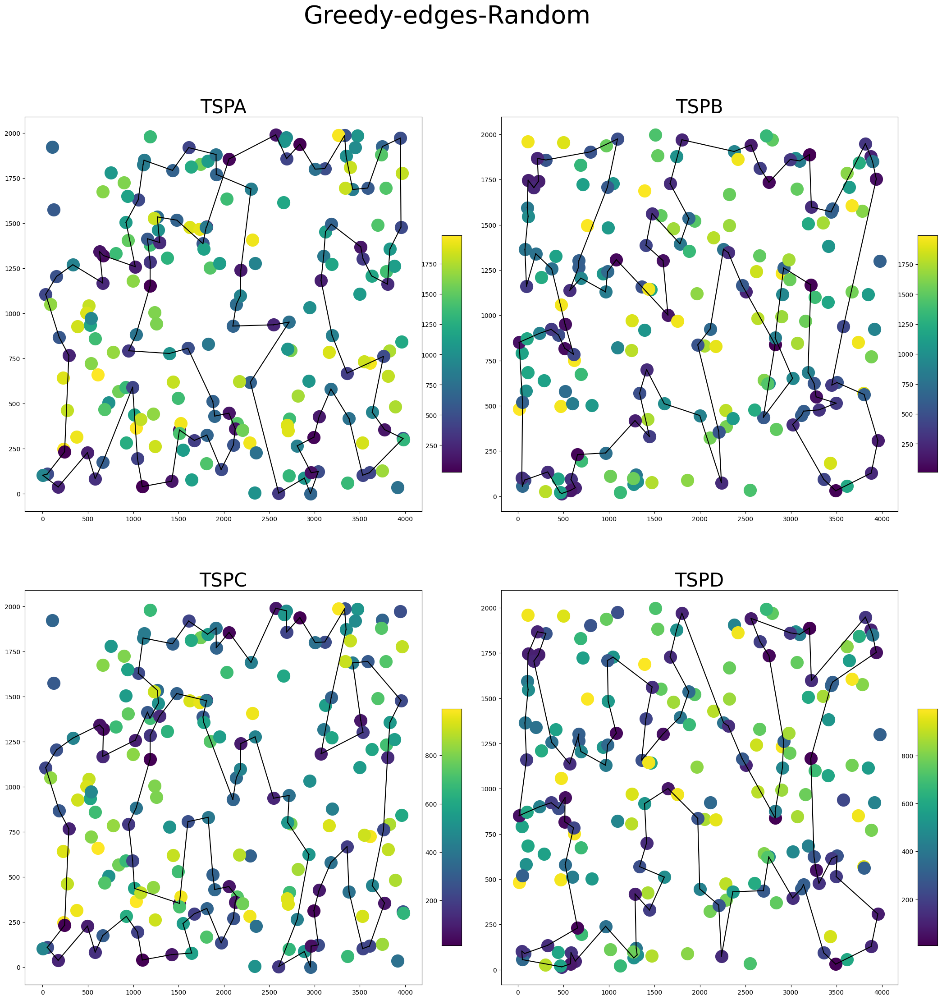

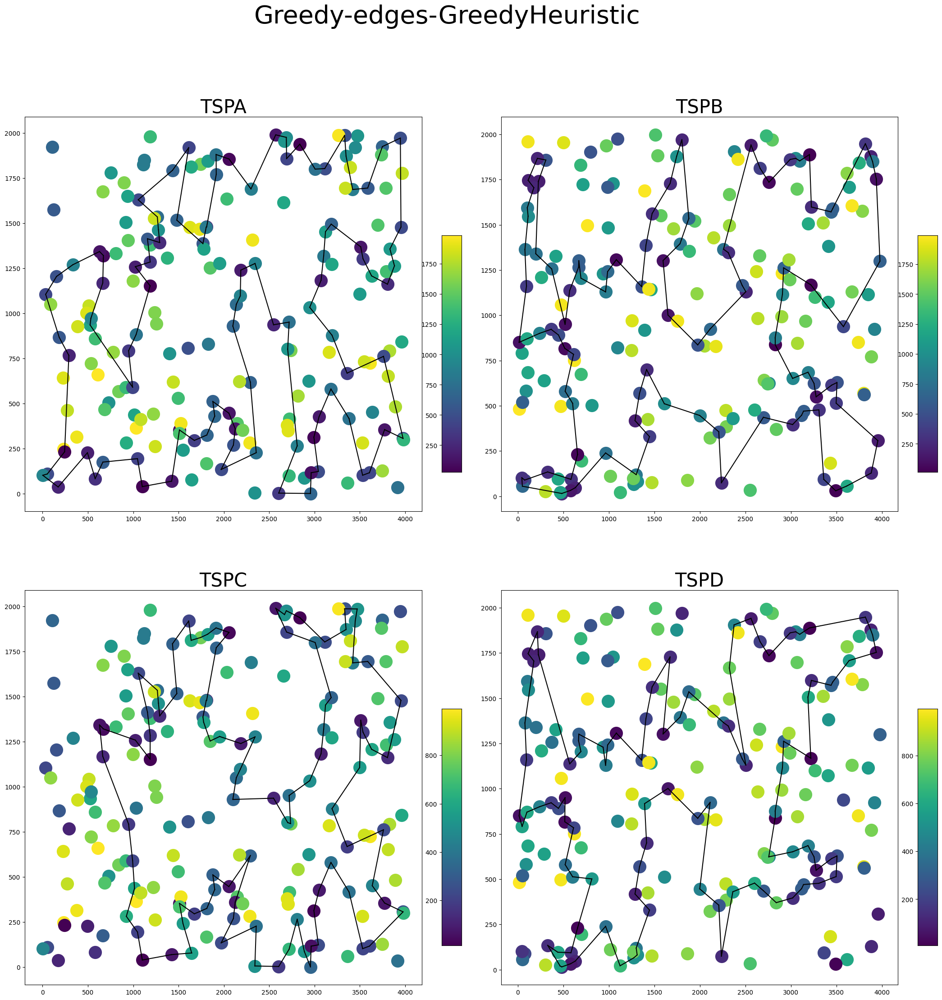

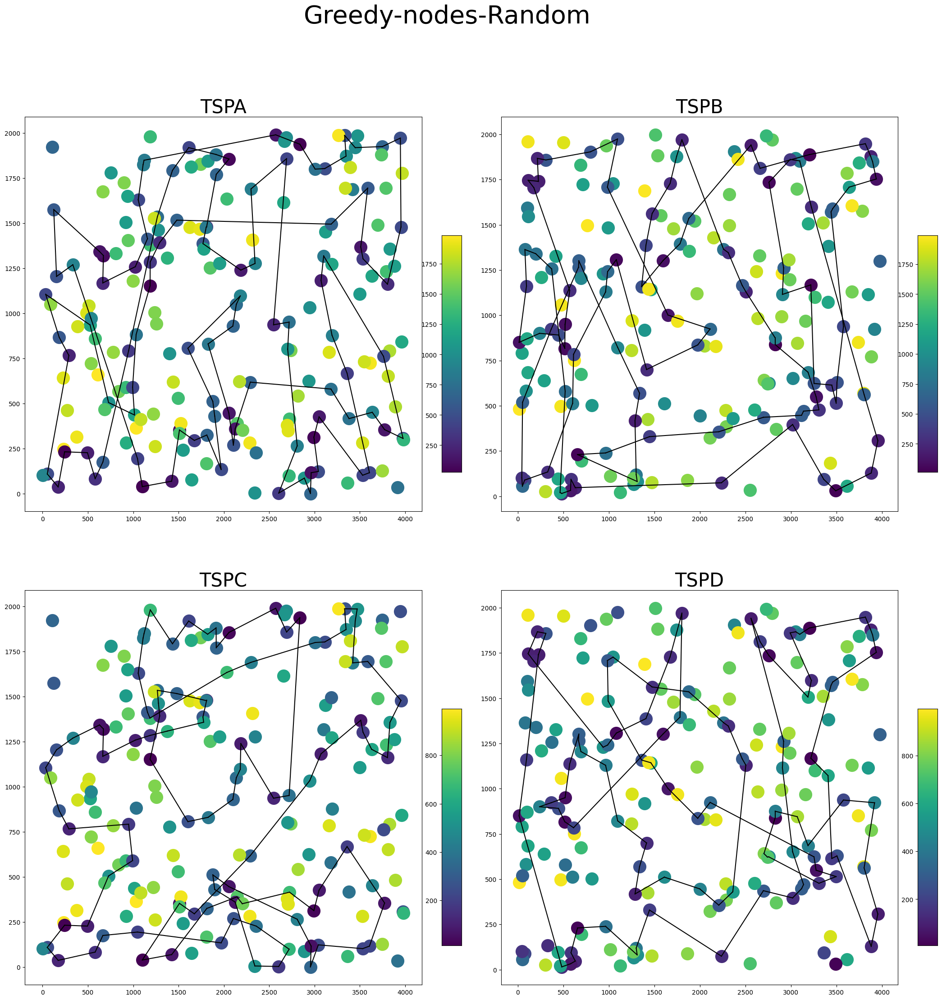

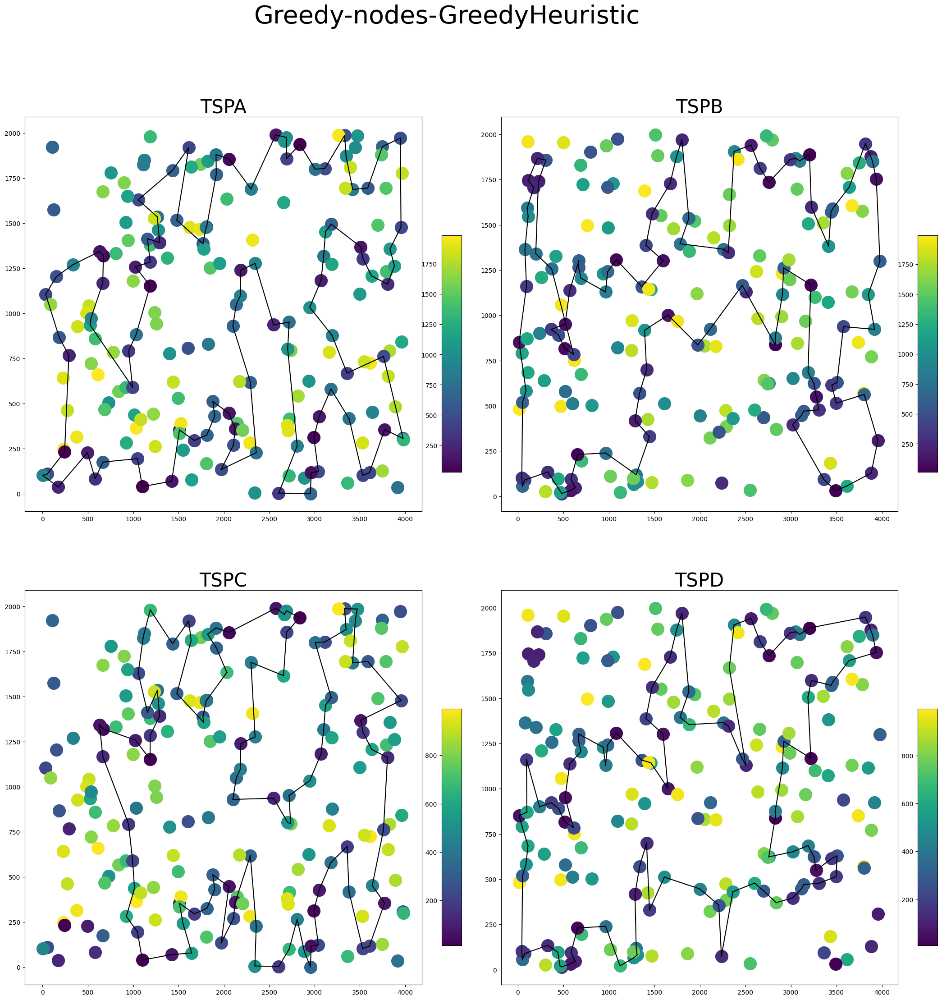

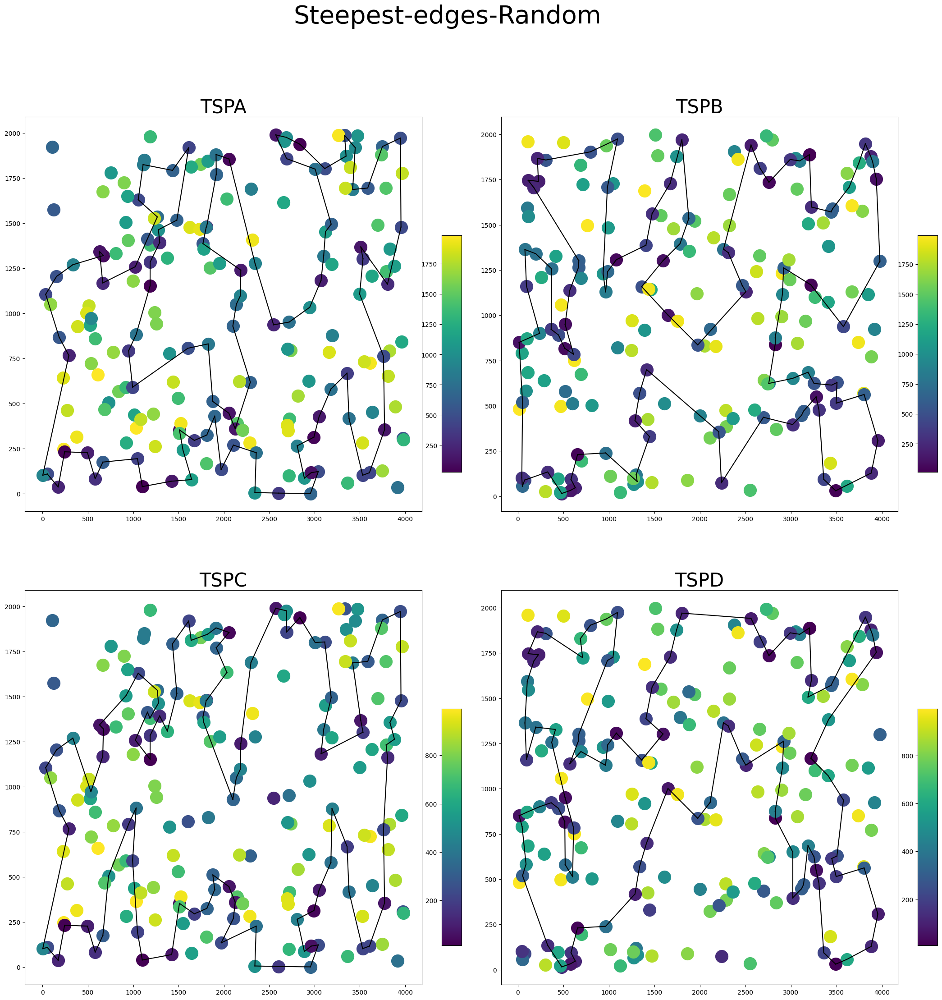

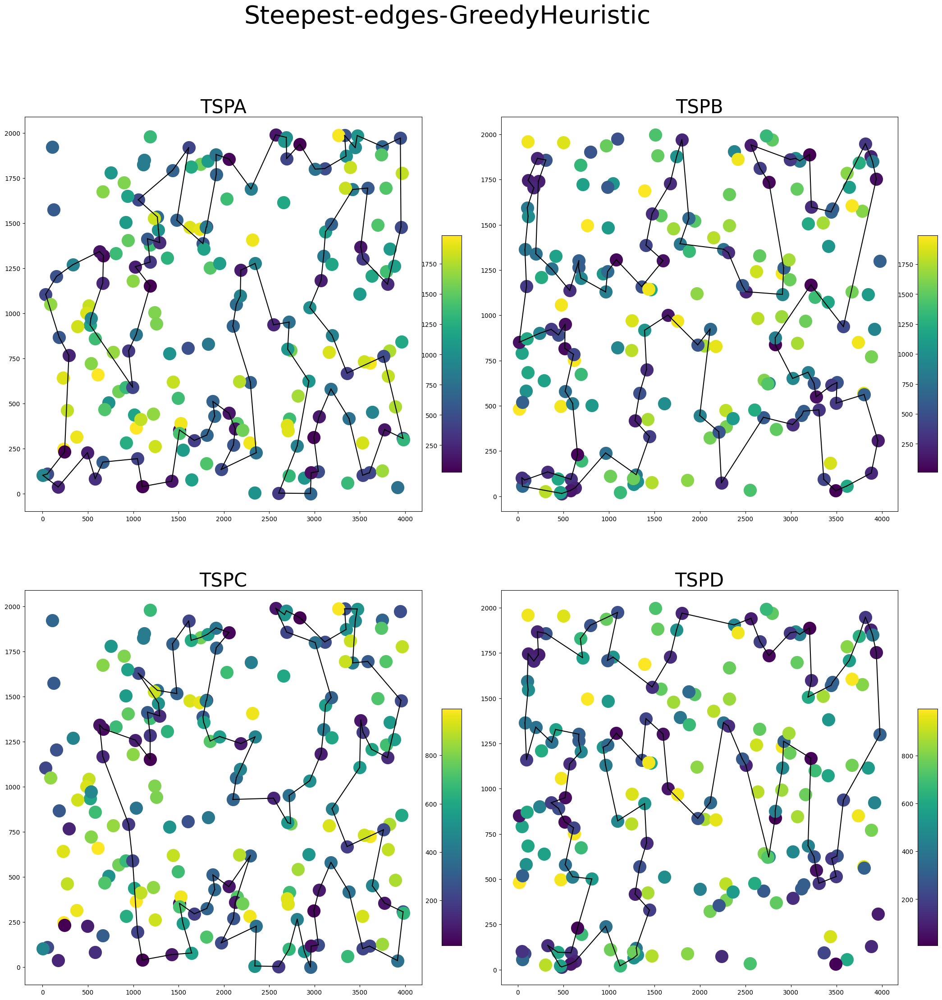

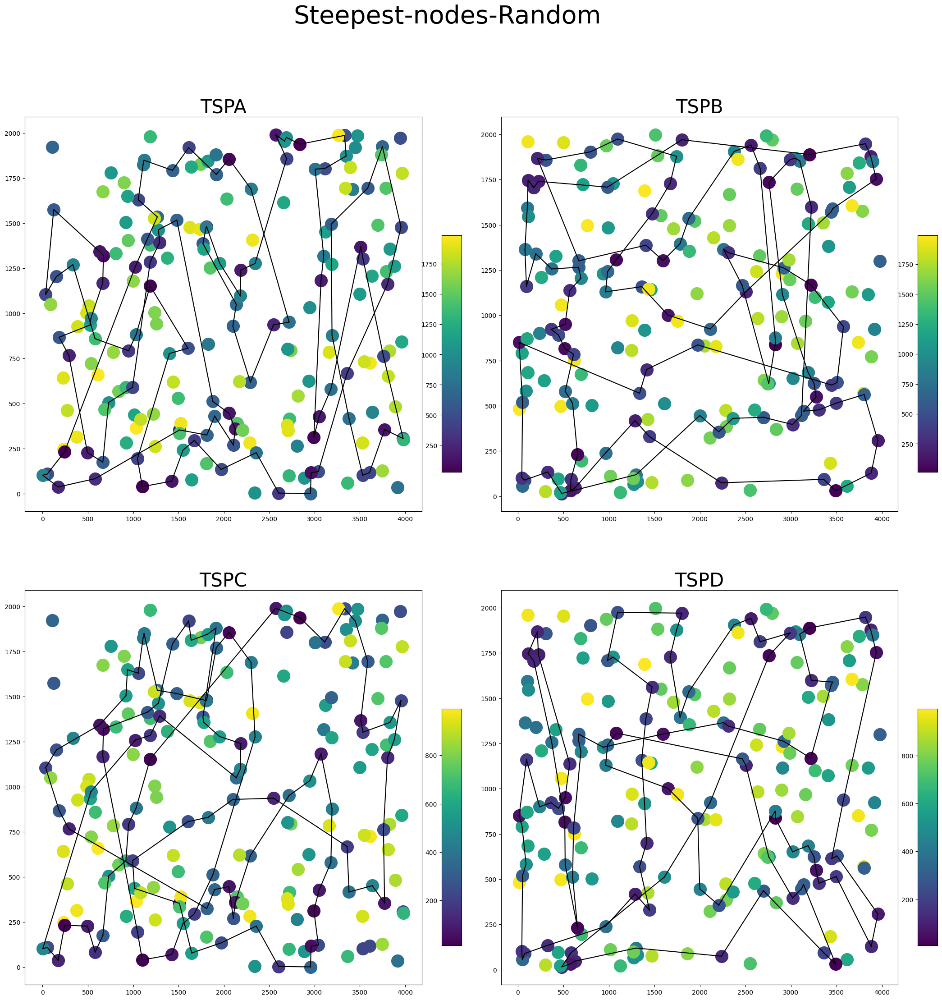

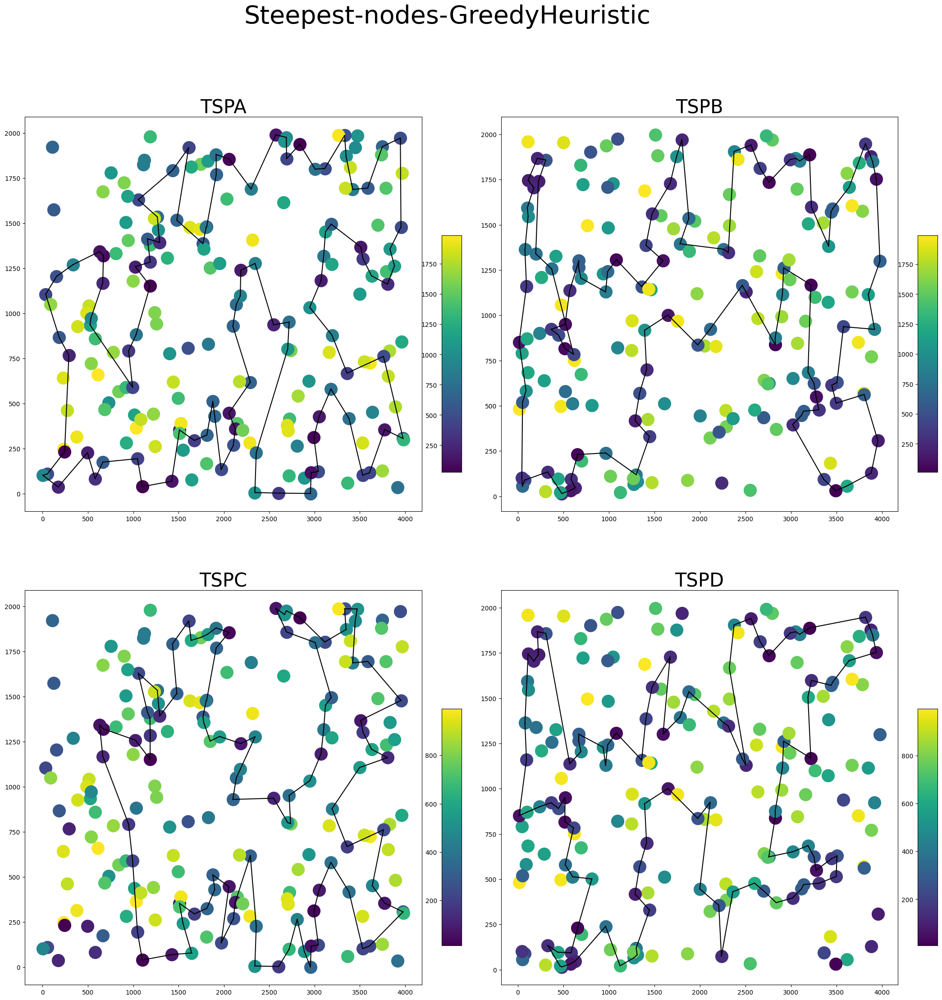

In [43]:
for algo in best_solutions:
    fig, ax = plt.subplots(2, 2, figsize=(25, 25))
    ax = ax.flatten()
    idx = 0
    fig.suptitle(algo, fontsize=40)
    for instance in best_solutions[algo]:
        solution = best_solutions[algo][instance]
        df = pd.read_csv(instance, names=['x', 'y', 'cost'], sep=';')
        weights = df['cost']
        cmap = plt.cm.viridis
        norm = mcolors.Normalize(vmin=min(weights), vmax=max(weights))
        ax[idx].set_title(instance.replace('../data/', '').replace('.csv', ''), fontsize=30)
        for i in range(len(df)):
            x, y, cost = df.iloc[i]['x'], df.iloc[i]['y'], df.iloc[i]['cost']
            ax[idx].plot(x, y, "o", markersize=20, color=cmap(norm(cost)))
        for i in range(len(solution)-1):
            x, y, cost = df.iloc[solution[i]]['x'], df.iloc[solution[i]]['y'], df.iloc[solution[i]]['cost']
            x_next, y_next = df.iloc[solution[i+1]]['x'], df.iloc[solution[i+1]]['y']
            ax[idx].plot((x, x_next), (y, y_next), "-", color='black')
        x, y = df.iloc[solution[0]]['x'], df.iloc[solution[0]]['y']
        ax[idx].plot((x, x_next), (y, y_next), "-", color='black')
        
        axins = ax[idx].inset_axes([1.05, 0.1, 0.05, 0.6], transform=ax[idx].transAxes)
        gradient = np.linspace(0, 1, 256).reshape(-1, 1)

        axins.imshow(gradient, aspect='auto', cmap=cmap, origin='lower', extent=[0, 1, min(weights), max(weights)])
        axins.xaxis.set_visible(False)
        
        idx += 1
        
    plt.savefig(f'./plots/{algo}_upd.png', dpi=300)
    plt.show()
    